## Overview

This notebook allos to make basic kinematic quantification of the differnt type of runs during a foraging session.
It also allows to gather those kinematic quantificatins across sessios and mice and plot them

### Prerequisites

- It rely on saved raw behavioral data (trajectory and trapezesitches saved in CSV files and results of the processing  saved in pickle files through `Behavior_Analysis.ipynb`.

### Structure

This notebook structure two steps
1. **Single session analysis and plotting**
2. **Across session and mice gather: Generates plots to visualize the performance metrics using the data dictionary**


In [1]:
import os
import pickle
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt #Creation de graphiques et de visualisations comme matlab
from matplotlib.patches import Polygon #Creation de graphiques et de visualisations comme matlab
from matplotlib import cm
import matplotlib.patches as mpatches
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
from scipy.ndimage import gaussian_filter as smooth
#import gc
import glob
#import time
from behavior_analysis_functions import list_sessions_analyzed, \
                                    process_session, html_mouse, load_data, MOUSE_STRING


In [2]:
# the path_to_data_folder is the path of the folder where you store your different mice.

# Windows:
# path_to_data_folder='C:'+os.sep+'Users'+os.sep+'MORVAN'+os.sep+'Documents'+os.sep+'patchouris'+os.sep+'Sample_Data'+os.sep
# Linux:
# path_to_data_folder '/home/david/Documents/Code/ForagingProject/Patchouris/patchouris/Sample_Data/'
# MacOs
# path_to_data_folder = '/Users/davidrobbe/Documents/Science/Data/ForagingMice/'

path_to_data_folder='/home/david/Documents/David/Data/'

#path_to_data_folder = '/Users/davidrobbe/Documents/Science/Data/ForagingMice/'

# List all mice in the data folder (If you want to process all the mice in your data folder),
mice_list = [os.path.basename(path) for path in glob.glob(path_to_data_folder + "/MOU*")]
mice_list=sorted(mice_list)
print(f'Found {len(mice_list)} {"mice" if len(mice_list) > 1 else "mouse"} in the data folder:')


#If you want to process a subset of mice uncomment the line below and comment the 2 lines above

#mice_list: list[str] = ["MOU2334"]  # For processing  a single mice. Equivalent to mice_list = ["MOU2334"] but more correct as it forces to create a list of string
mice_list=['MOU2329', 'MOU2330', 'MOU2331', 'MOU2332', 'MOU2333', 'MOU2334']
#print(f'Found {len(mice_list)} {"mice" if len(mice_list) > 1 else "mouse"} in the data folder:')

session_list = {}
for mouse in mice_list:
    mouse_folder = path_to_data_folder + mouse
    session_list[mouse] = sorted([name for name in os.listdir(mouse_folder)
                           if os.path.isdir(os.path.join(mouse_folder, name))
                           and name.startswith('MOU')])
    nb_sessions = len(session_list[mouse])
    print(f'Hello, I\'m {mouse}! I have foraged for {nb_sessions} sessions:')
    print(session_list[mouse], '\n')








Found 6 mice in the data folder:
Hello, I'm MOU2329! I have foraged for 24 sessions:
['MOU2329_20240607-1315', 'MOU2329_20240607-1714', 'MOU2329_20240610-0936', 'MOU2329_20240610-1336', 'MOU2329_20240611-0915', 'MOU2329_20240611-1324', 'MOU2329_20240612-0918', 'MOU2329_20240612-1341', 'MOU2329_20240613-0914', 'MOU2329_20240613-1405', 'MOU2329_20240614-0820', 'MOU2329_20240614-1331', 'MOU2329_20240617-0829', 'MOU2329_20240617-1420', 'MOU2329_20240618-0829', 'MOU2329_20240618-1451', 'MOU2329_20240619-0828', 'MOU2329_20240619-1406', 'MOU2329_20240620-0821', 'MOU2329_20240620-1339', 'MOU2329_20240621-0829', 'MOU2329_20240621-1425', 'MOU2329_20240624-0832', 'MOU2329_20240624-1420'] 

Hello, I'm MOU2330! I have foraged for 24 sessions:
['MOU2330_20240607-1335', 'MOU2330_20240607-1733', 'MOU2330_20240610-0956', 'MOU2330_20240610-1357', 'MOU2330_20240611-0936', 'MOU2330_20240611-1342', 'MOU2330_20240612-0937', 'MOU2330_20240612-1400', 'MOU2330_20240613-0933', 'MOU2330_20240613-1424', 'MOU2330_

In [3]:
def trapezes_from_patch(patch, width):
    """
    generate the trapezes coordinates surrounding a patch
    inputs:
    patch - coordinates of a patch [[Xa, Ya], [Xb, Yb], [Xc, Yc], [Xd, Yd]]
    width - width of the trapeze in pixels
    outputs:
    coordinates [[Xa, Ya], [Xb, Yb], [Xc, Yc], [Xd, Yd]] for the 4 trapezes.
    
    trapezes_from_patch(SWpatch_coords, 200)
    """

    N = [patch[0], patch[1], [patch[1][0]+width, patch[1][1]+width], [patch[0][0]-width, patch[0][1]+width]]
    E = [patch[1], patch[2], [patch[2][0]+width, patch[2][1]-width], [patch[1][0]+width, patch[1][1]+width]]
    S = [patch[2], patch[3], [patch[3][0]-width, patch[3][1]-width], [patch[2][0]+width, patch[2][1]-width]]
    W = [patch[3], patch[0], [patch[0][0]-width, patch[0][1]+width], [patch[3][0]-width, patch[3][1]-width]]
    return N, E, S, W


RESOLUTION = 512, 512
TRAPEZE_SIZE = 35 #how much to extend outside of the objects to detect the trajectories
NWpatch_coords = [[104, RESOLUTION[1] -  125], [173, RESOLUTION[1] -  125], [173, RESOLUTION[1] -  201], [104, RESOLUTION[1] -  201]]
NEpatch_coords = [[330, RESOLUTION[1] -  120], [400, RESOLUTION[1] -  120], [400, RESOLUTION[1] -  200], [330, RESOLUTION[1] -  200]]
SWpatch_coords = [[109, RESOLUTION[1] -  351], [181, RESOLUTION[1] -  351], [181, RESOLUTION[1] -  410], [109, RESOLUTION[1] -  410]]
SEpatch_coords = [[330, RESOLUTION[1] -  350], [400, RESOLUTION[1] -  350], [400, RESOLUTION[1] -  410], [330, RESOLUTION[1] -  410]]

collection_trapeze = {"NW":dict(), "NE":dict(), "SW":dict(), "SE":dict()}
collection_trapeze["NW"]["N"], collection_trapeze["NW"]["E"], collection_trapeze["NW"]["S"], collection_trapeze["NW"]["W"] = trapezes_from_patch(NWpatch_coords, TRAPEZE_SIZE)
collection_trapeze["NE"]["N"], collection_trapeze["NE"]["E"], collection_trapeze["NE"]["S"], collection_trapeze["NE"]["W"] = trapezes_from_patch(NEpatch_coords, TRAPEZE_SIZE)
collection_trapeze["SW"]["N"], collection_trapeze["SW"]["E"], collection_trapeze["SW"]["S"], collection_trapeze["SW"]["W"] = trapezes_from_patch(SWpatch_coords, TRAPEZE_SIZE)
collection_trapeze["SE"]["N"], collection_trapeze["SE"]["E"], collection_trapeze["SE"]["S"], collection_trapeze["SE"]["W"] = trapezes_from_patch(SEpatch_coords, TRAPEZE_SIZE)

In [4]:
mice_list

['MOU2329', 'MOU2330', 'MOU2331', 'MOU2332', 'MOU2333', 'MOU2334']

In [5]:
session_list

{'MOU2329': ['MOU2329_20240607-1315',
  'MOU2329_20240607-1714',
  'MOU2329_20240610-0936',
  'MOU2329_20240610-1336',
  'MOU2329_20240611-0915',
  'MOU2329_20240611-1324',
  'MOU2329_20240612-0918',
  'MOU2329_20240612-1341',
  'MOU2329_20240613-0914',
  'MOU2329_20240613-1405',
  'MOU2329_20240614-0820',
  'MOU2329_20240614-1331',
  'MOU2329_20240617-0829',
  'MOU2329_20240617-1420',
  'MOU2329_20240618-0829',
  'MOU2329_20240618-1451',
  'MOU2329_20240619-0828',
  'MOU2329_20240619-1406',
  'MOU2329_20240620-0821',
  'MOU2329_20240620-1339',
  'MOU2329_20240621-0829',
  'MOU2329_20240621-1425',
  'MOU2329_20240624-0832',
  'MOU2329_20240624-1420'],
 'MOU2330': ['MOU2330_20240607-1335',
  'MOU2330_20240607-1733',
  'MOU2330_20240610-0956',
  'MOU2330_20240610-1357',
  'MOU2330_20240611-0936',
  'MOU2330_20240611-1342',
  'MOU2330_20240612-0937',
  'MOU2330_20240612-1400',
  'MOU2330_20240613-0933',
  'MOU2330_20240613-1424',
  'MOU2330_20240614-0840',
  'MOU2330_20240614-1351',
  'MO

In [6]:
path_to_data_folder

'/home/david/Documents/David/Data/'

In [7]:
mouse_folder_path=os.path.join(path_to_data_folder,mice_list[0])
print(mouse_folder_path)

/home/david/Documents/David/Data/MOU2329


In [33]:
print(session_list[mice_list[0]][11])

MOU2329_20240614-1331


In [34]:
traj_df, turns_df, param_df=load_data(mouse_folder_path,session_list[mice_list[0]][11])
# smooth the trajectory and correct for some open CV flipping
TRUE_SIGMA = 1 #the sigma used for the remaining of the analysis for smoothing
traject_time = traj_df['time'].to_numpy()
xpositions = traj_df['xposition'].to_numpy()
ypositions = traj_df['yposition'].to_numpy()
ypositions = RESOLUTION[1] - ypositions # yposition is inverted, puts it back in the right way. DAvid: this is not simply an inversion because resolution is added
smoothed_Xpositions = smooth(xpositions, TRUE_SIGMA)
smoothed_Ypositions = smooth(ypositions, TRUE_SIGMA) # Smoothes the positions with true sigma


def compute_distance_and_speed(smoothed_Xpositions, smoothed_Ypositions, traject_time):
    # Calculate the differences between consecutive points
    delta_x = np.diff(smoothed_Xpositions)
    delta_y = np.diff(smoothed_Ypositions)
    delta_t = np.diff(traject_time)
    
    # Compute the distances traveled between each timepoint
    distances = np.sqrt(delta_x**2 + delta_y**2)
    distances=distances*(84/RESOLUTION[0])
    
    # Compute the speeds between each timepoint
    speeds = distances / delta_t
    
    return distances, speeds


distances, speeds = compute_distance_and_speed(smoothed_Xpositions, smoothed_Ypositions, traject_time)

print("Distances:", distances)
print("Speeds:", speeds)



Distances: [7.53995961e-01 1.03442464e+00 1.13601846e+00 ... 7.05145710e-04
 2.19565869e-05 0.00000000e+00]
Speeds: [1.75347898e+01 2.65237086e+01 2.91286784e+01 ... 1.85564661e-02
 5.22775877e-04 0.00000000e+00]


In [35]:


pathtopicklefolder=os.path.join(mouse_folder_path,session_list[mice_list[0]][11],'Pickle_data')
print(pathtopicklefolder)
# List all files in the current directory
os.chdir(pathtopicklefolder)
files_in_directory = os.listdir()

# Filter out the pickle files
pickle_files = sorted([file for file in files_in_directory if file.endswith('.pkl')])

# Print the list of pickle files
for pickle_file in pickle_files:
    print(pickle_file)

file_to_load = pickle_files[0]
print(f"\nLoading pickle file: {file_to_load}")

# Open and load the pickle file
with open(file_to_load, 'rb') as f:
    loaded_data = pickle.load(f)

# Print the loaded data to verify
print("\nLoaded data from the pickle file:")
print(loaded_data)
around_towers = [epoch for epoch in loaded_data if epoch[2][0] == "Q"]
between_towers = [epoch for epoch in loaded_data if epoch[2][0] == "B"]
toward_towers = [epoch for epoch in loaded_data if epoch[2][0] == "T"] # All trajectories towards objects
other_runs = [epoch for epoch in loaded_data if epoch[2][0] == "N"] # All other trajectories


/home/david/Documents/David/Data/MOU2329/MOU2329_20240614-1331/Pickle_data
all_running_epochs.pkl
consecutive_quarter_turns.pkl
cw_ccw_cumul.pkl
cw_ccw_speeds.pkl
distance_traveled.pkl
rewards_cumul.pkl
speed_profile_qt.pkl
total_nb_CW_CCW.pkl
total_nb_QT_types.pkl

Loading pickle file: all_running_epochs.pkl

Loaded data from the pickle file:
[[0, 49, 'BSENEn', np.int64(4)], [51, 200, 'N', np.int64(7)], [272, 316, 'N', 0], [330, 353, 'TSE', 0], [357, 376, 'QwGSER', np.int64(8)], [392, 431, 'N', np.int64(10)], [441, 461, 'QwDSER', np.int64(11)], [463, 478, 'QwGSER', np.int64(11)], [489, 505, 'QwDSER', np.int64(12)], [522, 559, 'BSENEn', np.int64(12)], [574, 599, 'QkGNER', np.int64(13)], [623, 640, 'QkGNER', np.int64(14)], [649, 668, 'QkDNER', np.int64(15)], [683, 702, 'QkGNER', np.int64(15)], [745, 801, 'BNESEn', np.int64(16)], [804, 823, 'QwGSER', np.int64(17)], [832, 849, 'QwGSER', np.int64(18)], [856, 875, 'N', 0], [877, 891, 'TNE', np.int64(19)], [906, 923, 'QkGNER', np.int64(20)],

In [36]:


def plot_run_type(traject_time, smoothed_Xpositions, smoothed_Ypositions, runtype_epochs, collection_trapeze, q=4, runtype_name='same type of run'):
    fig, ax1 = plt.subplots(figsize=(10, 8))
    totaltime = 0
    totaldistance = 0
    meanspeed=[]
    maxspeed=[]
    
    distances, speeds = compute_distance_and_speed(smoothed_Xpositions, smoothed_Ypositions, traject_time)

    for patch in collection_trapeze:  # plot the trapeze around the object
        for trapeze in collection_trapeze[patch]:
            shape = Polygon(np.array(collection_trapeze[patch][trapeze]), color="lemonchiffon")
            ax1.add_patch(shape)

    for runtype_epoch in runtype_epochs:
        start_index, end_index = runtype_epoch[0], runtype_epoch[1]
        
        # Check if the indexes are within the bounds of the arrays
        if start_index < 0 or end_index >= len(traject_time):
            print(f"Indexes out of bounds for runtype_epoch: {runtype_epoch}")
            continue

        # Extract the run epoch, compute duration, distance and speed
        runtype_epoch_Xposition = smoothed_Xpositions[start_index:end_index + 1]
        runtype_epoch_Yposition = smoothed_Ypositions[start_index:end_index + 1]
        epochduration = traject_time[end_index] - traject_time[start_index]
        totaltime += epochduration
        distanceran=np.sum(distances[start_index:end_index])
        totaldistance += distanceran
        meanspeed.append(distanceran / epochduration )
        maxspeed.append(np.max(speeds[start_index:end_index]))

        # Plot the trajectory
        ax1.plot(runtype_epoch_Xposition, runtype_epoch_Yposition, linestyle='-', label=f"Traj {start_index}-{end_index}")
        
        # Plot the start and end points
        ax1.plot(runtype_epoch_Xposition[0], runtype_epoch_Yposition[0], 'go', markersize=3)  # Start point
        #ax1.plot(runtype_epoch_Xposition[-1], runtype_epoch_Yposition[-1], 'ro', markersize=10)  # End point

        # Compute the direction of the arrow using the last q points
        if len(runtype_epoch_Xposition) >= q:
            dx = runtype_epoch_Xposition[-1] - runtype_epoch_Xposition[-q]
            dy = runtype_epoch_Yposition[-1] - runtype_epoch_Yposition[-q]
            
            # Normalize the direction
            norm = np.hypot(dx, dy)
            if norm != 0:
                dx /= norm
                dy /= norm
            
            # Plot the arrow
            ax1.arrow(runtype_epoch_Xposition[-1], runtype_epoch_Yposition[-1], dx, dy,
                      head_width=6, head_length=5, fc='red', ec='red')
    
    # print(maxspeed)
    print(np.median(maxspeed))
    # print(meanspeed)
    # # Set the title including the total duration
    ax1.set_xlabel('X Position')
    ax1.set_ylabel('Y Position')
    ax1.set_title(f"{runtype_name} (Tot. Duration: {totaltime:.2f}s.; Tot. Distance: {totaldistance:.2f}cm; Mean speed: {np.mean(meanspeed):.2f}cm/s; Max speed: {np.mean(maxspeed):.2f}cm/s)")
    ax1.grid(True)
    # ax1.legend()
    plt.show()




53.665526942686185


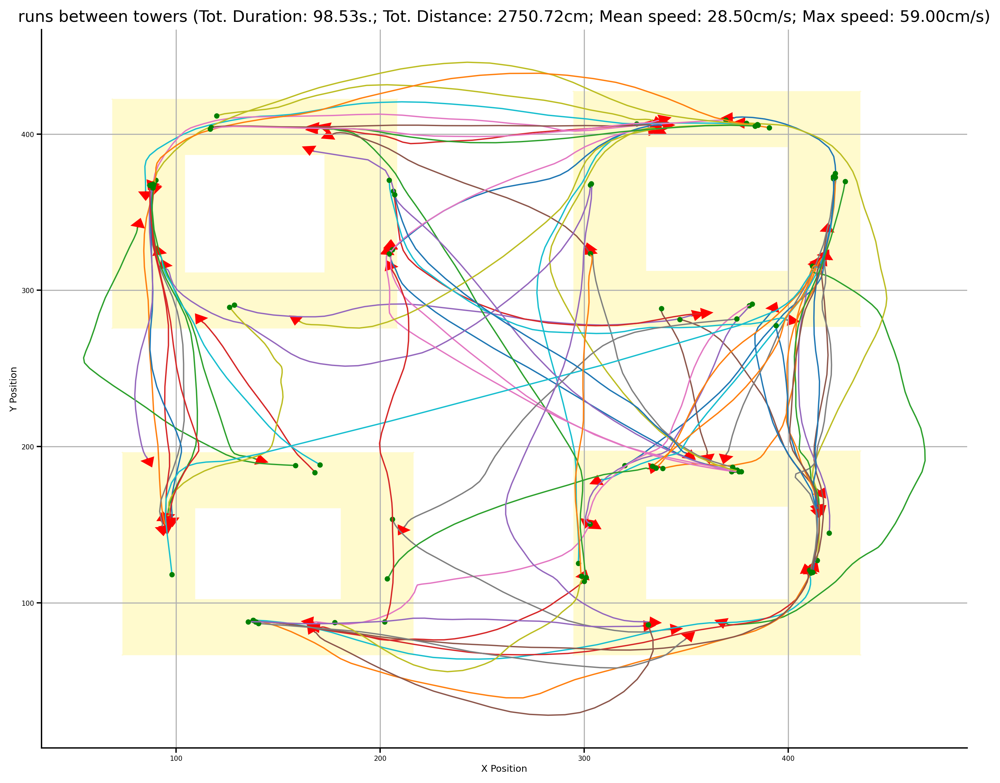

In [19]:
plot_run_type(traject_time, smoothed_Xpositions, smoothed_Ypositions, between_towers,collection_trapeze, runtype_name='runs between towers', q=4)

37.186293804538025


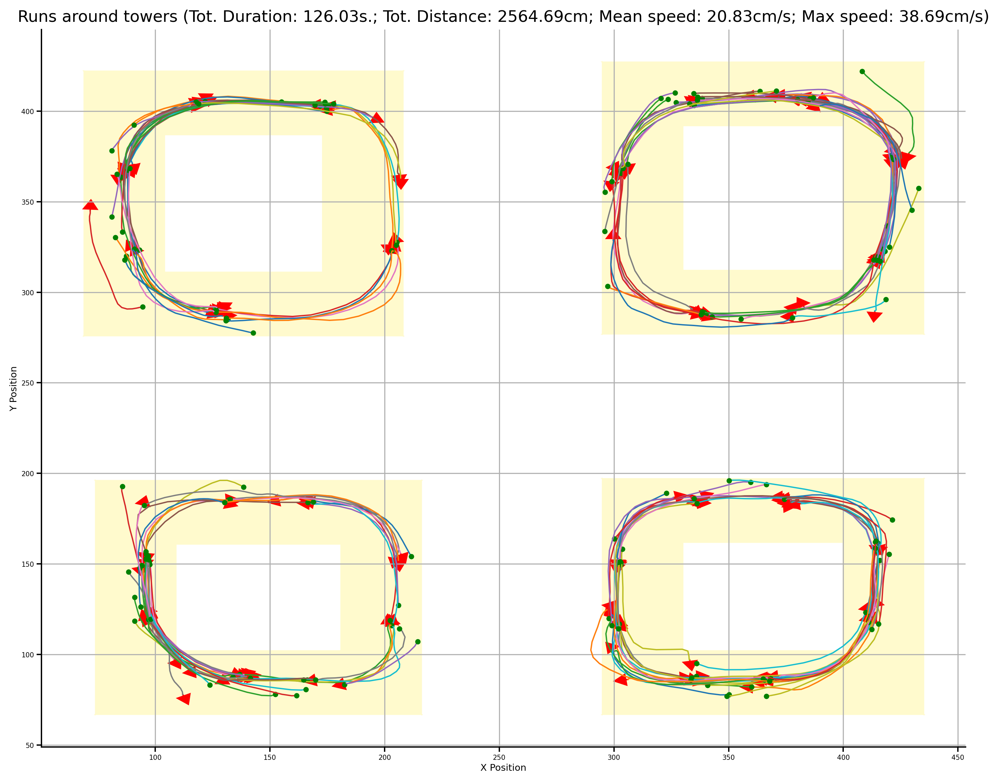

In [20]:
plot_run_type(traject_time, smoothed_Xpositions, smoothed_Ypositions, around_towers,collection_trapeze, runtype_name='Runs around towers', q=4)


34.961283820157384


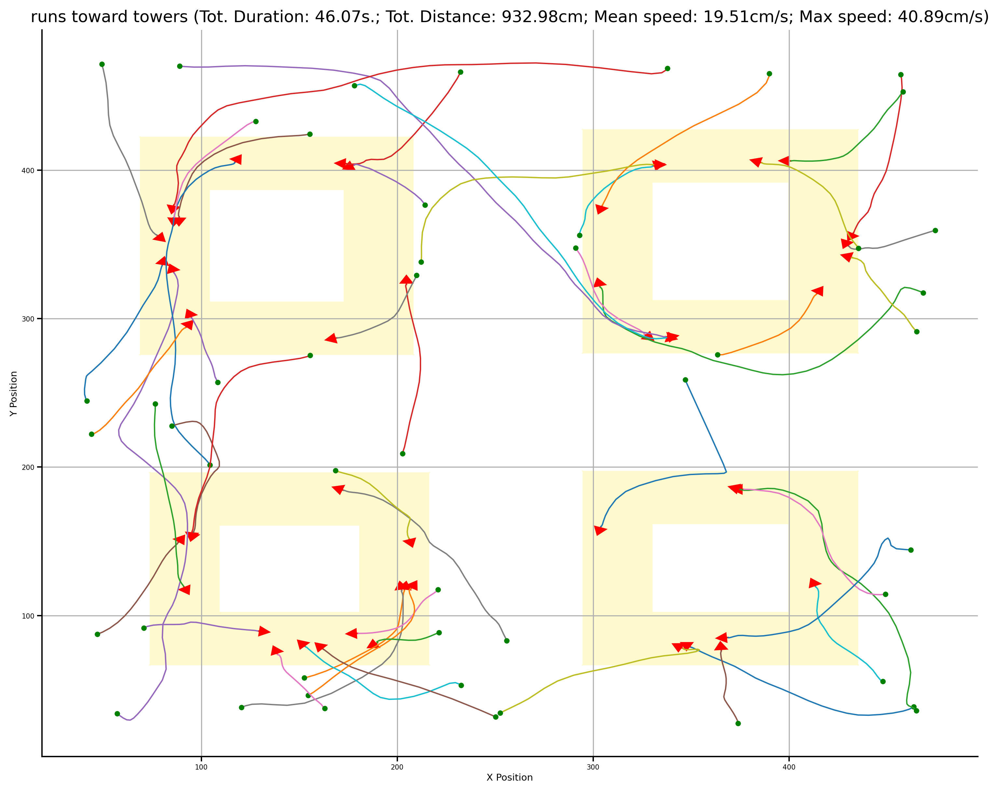

In [21]:
plot_run_type(traject_time, smoothed_Xpositions, smoothed_Ypositions, toward_towers,collection_trapeze, runtype_name='runs toward towers', q=4)


32.266501140004664


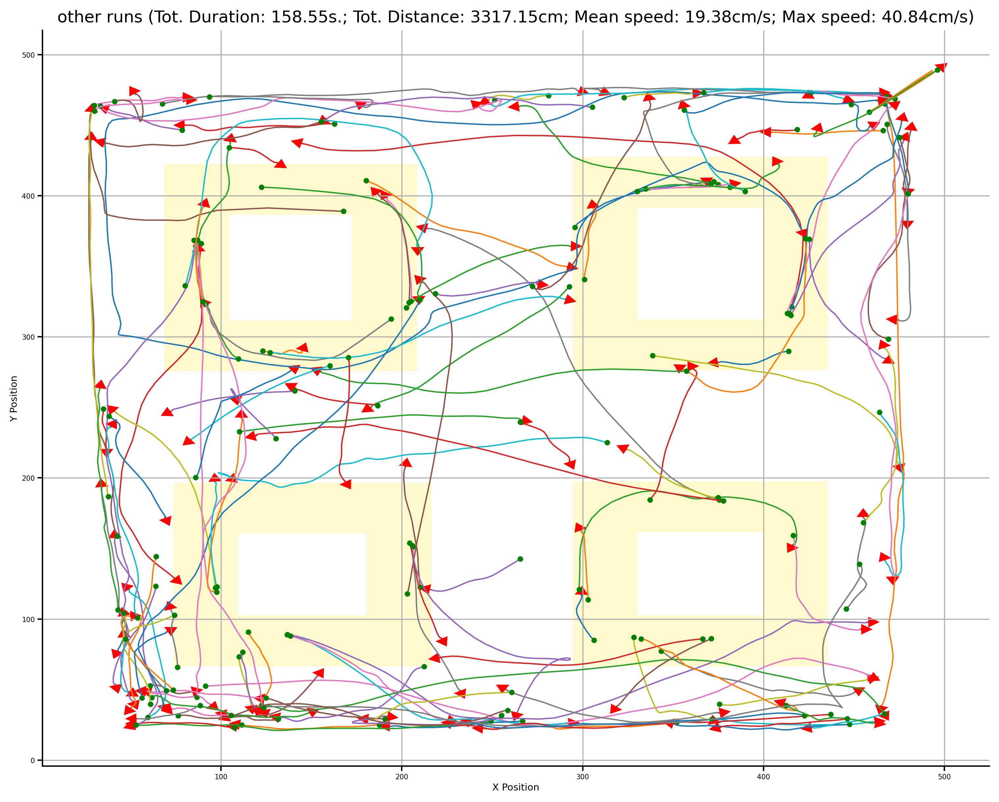

In [37]:

plot_run_type(traject_time, smoothed_Xpositions, smoothed_Ypositions, other_runs,collection_trapeze, runtype_name='other runs', q=4)


Above this cell we have a code that allow to select specifc types of running epochs relative to the tower position and get the trajectories and time of those epoch

Below we have a series of code that can do basic qunatification on those epochs separately for the different type of running epochs

We start with an exemple session

In [55]:
mouse_folder_path=os.path.join(path_to_data_folder,mice_list[0])
print(mouse_folder_path)
print(session_list[mice_list[0]][11])

/home/david/Documents/David/Data/MOU2329
MOU2329_20240614-1331


In [56]:
traj_df, turns_df, param_df=load_data(mouse_folder_path,session_list[mice_list[0]][11])
# smooth the trajectory and correct for some open CV flipping
TRUE_SIGMA = 1 #the sigma used for the remaining of the analysis for smoothing
traject_time = traj_df['time'].to_numpy()
xpositions = traj_df['xposition'].to_numpy()
ypositions = traj_df['yposition'].to_numpy()
ypositions = RESOLUTION[1] - ypositions # yposition is inverted, puts it back in the right way. DAvid: this is not simply an inversion because resolution is added
smoothed_Xpositions = smooth(xpositions, TRUE_SIGMA)
smoothed_Ypositions = smooth(ypositions, TRUE_SIGMA) # Smoothes the positions with true sigma


def compute_distance_and_speed(smoothed_Xpositions, smoothed_Ypositions, traject_time):
    # Calculate the differences between consecutive points
    delta_x = np.diff(smoothed_Xpositions)
    delta_y = np.diff(smoothed_Ypositions)
    delta_t = np.diff(traject_time)
    
    # Compute the distances traveled between each timepoint
    distances = np.sqrt(delta_x**2 + delta_y**2)
    distances=distances*(84/RESOLUTION[0])
    
    # Compute the speeds between each timepoint
    speeds = distances / delta_t
    
    return distances, speeds


distances, speeds = compute_distance_and_speed(smoothed_Xpositions, smoothed_Ypositions, traject_time)

print("Distances:", distances)
print("Speeds:", speeds)



Distances: [7.53995961e-01 1.03442464e+00 1.13601846e+00 ... 7.05145710e-04
 2.19565869e-05 0.00000000e+00]
Speeds: [1.75347898e+01 2.65237086e+01 2.91286784e+01 ... 1.85564661e-02
 5.22775877e-04 0.00000000e+00]


In [59]:


pathtopicklefolder=os.path.join(mouse_folder_path,session_list[mice_list[0]][11],'Pickle_data')
print(pathtopicklefolder)
# List all files in the current directory
os.chdir(pathtopicklefolder)
files_in_directory = os.listdir()

# Filter out the pickle files
pickle_files = sorted([file for file in files_in_directory if file.endswith('.pkl')])

# Print the list of pickle files
for pickle_file in pickle_files:
    print(pickle_file)

file_to_load = pickle_files[0]
print(f"\nLoading pickle file: {file_to_load}")

# Open and load the pickle file
with open(file_to_load, 'rb') as f:
    loaded_data = pickle.load(f)

# Print the loaded data to verify
print("\nLoaded data from the pickle file:")
print(loaded_data)
around_towers = [epoch for epoch in loaded_data if epoch[2][0] == "Q"]
between_towers = [epoch for epoch in loaded_data if epoch[2][0] == "B"]
toward_towers = [epoch for epoch in loaded_data if epoch[2][0] == "T"] # All trajectories towards objects
other_runs = [epoch for epoch in loaded_data if epoch[2][0] == "N"] # All other trajectories

runtypes=[around_towers,between_towers,toward_towers,other_runs]
runtypes_names=['around_towers','between_towers','toward_towers','other_runs']


/home/david/Documents/David/Data/MOU2329/MOU2329_20240614-1331/Pickle_data
all_running_epochs.pkl
consecutive_quarter_turns.pkl
cw_ccw_cumul.pkl
cw_ccw_speeds.pkl
distance_traveled.pkl
rewards_cumul.pkl
speed_profile_qt.pkl
total_nb_CW_CCW.pkl
total_nb_QT_types.pkl

Loading pickle file: all_running_epochs.pkl

Loaded data from the pickle file:
[[0, 49, 'BSENEn', np.int64(4)], [51, 200, 'N', np.int64(7)], [272, 316, 'N', 0], [330, 353, 'TSE', 0], [357, 376, 'QwGSER', np.int64(8)], [392, 431, 'N', np.int64(10)], [441, 461, 'QwDSER', np.int64(11)], [463, 478, 'QwGSER', np.int64(11)], [489, 505, 'QwDSER', np.int64(12)], [522, 559, 'BSENEn', np.int64(12)], [574, 599, 'QkGNER', np.int64(13)], [623, 640, 'QkGNER', np.int64(14)], [649, 668, 'QkDNER', np.int64(15)], [683, 702, 'QkGNER', np.int64(15)], [745, 801, 'BNESEn', np.int64(16)], [804, 823, 'QwGSER', np.int64(17)], [832, 849, 'QwGSER', np.int64(18)], [856, 875, 'N', 0], [877, 891, 'TNE', np.int64(19)], [906, 923, 'QkGNER', np.int64(20)],

In [58]:

## this function does simple kineamtic analysis for all the run epoch of a given type
def analyse_run_type(traject_time, smoothed_Xpositions, smoothed_Ypositions, runtype_epochs):
    totaltime = 0
    totaldistance = 0
    meanspeed=[]
    maxspeed=[]
    
    distances, speeds = compute_distance_and_speed(smoothed_Xpositions, smoothed_Ypositions, traject_time)


    for runtype_epoch in runtype_epochs:
        start_index, end_index = runtype_epoch[0], runtype_epoch[1]
        
        # Check if the indexes are within the bounds of the arrays
        if start_index < 0 or end_index >= len(traject_time):
            print(f"Indexes out of bounds for runtype_epoch: {runtype_epoch}")
            continue

        # Extract the run epoch, compute duration, distance and speed
        epochduration = traject_time[end_index] - traject_time[start_index]
        totaltime += epochduration
        distanceran=np.sum(distances[start_index:end_index])
        totaldistance += distanceran
        meanspeed.append(distanceran / epochduration)
        maxspeed.append(np.max(speeds[start_index:end_index]))

        
    
    return totaltime,totaldistance,meanspeed, maxspeed
   


In [60]:


# Initialize an empty dictionary to store the results
runtypes_basic_kinematics = {}

# Loop through runtypes and runtypes_names in parallel
for runtype, runtype_name in zip(runtypes, runtypes_names):
    # Perform the analysis
    totaltime, totaldistance, meanspeed, maxspeed = analyse_run_type(traject_time, smoothed_Xpositions, smoothed_Ypositions, runtype)
    
    # Store the results in the dictionary using descriptive keys
    runtypes_basic_kinematics[runtype_name] = {
        'total_time': totaltime,
        'total_distance': totaldistance,
        'mean_speed': meanspeed,
        'max_speed': maxspeed
    }

# Now you can access the results in the dictionary
print(runtypes_basic_kinematics)

{'around_towers': {'total_time': np.float64(126.029), 'total_distance': np.float64(2564.6942977892345), 'mean_speed': [np.float64(17.37290874989845), np.float64(21.594736955644986), np.float64(23.64029418768815), np.float64(23.045308753276686), np.float64(21.872118630101216), np.float64(20.018930701583844), np.float64(20.90688666363986), np.float64(18.91677749487181), np.float64(18.678284469337783), np.float64(21.744769309067937), np.float64(28.695458471738572), np.float64(21.94645590018432), np.float64(18.960268073532223), np.float64(21.322433439114032), np.float64(21.610195661437317), np.float64(23.268474721007443), np.float64(20.316816368028405), np.float64(19.12874999679684), np.float64(22.52367568180794), np.float64(22.592165272742548), np.float64(17.786621109755625), np.float64(23.835177825486994), np.float64(18.789785747136147), np.float64(25.093227280138308), np.float64(22.54675612030153), np.float64(24.90737983651041), np.float64(16.93953719033941), np.float64(27.1597071547468

In [61]:
np.median(runtypes_basic_kinematics['around_towers']['max_speed'])

np.float64(37.186293804538025)

End of the single session illustration. you can check that the above result fit with what is in the html visualisation

Below the same analysis of run kinematics by run type is done across a group of mice which have been recorded across session

In [62]:
mice_list

['MOU2329', 'MOU2330', 'MOU2331', 'MOU2332', 'MOU2333', 'MOU2334']

In [63]:
# this function can loqd pickled data across mice and session and store them in a data dictionnary
def load_pickled_data(path_to_data_folder, mice_list, pickle_files):
    data = {}

    for mouse in mice_list:
        mouse_folder = os.path.join(path_to_data_folder, mouse)
        if not os.path.isdir(mouse_folder):
            print(f"Mouse folder not found: {mouse_folder}")
            continue
        
        data[mouse] = {}

        session_folders = [folder for folder in os.listdir(mouse_folder) 
                           if folder.startswith('MOU') and os.path.isdir(os.path.join(mouse_folder, folder))]
        session_folders=sorted(session_folders)

        for session_folder in session_folders:
            session_folder_path = os.path.join(mouse_folder, session_folder)
            pickle_data_folder = os.path.join(session_folder_path, 'Pickle_data')

            if not os.path.isdir(pickle_data_folder):
                print(f"Pickle_data folder not found in {session_folder_path}")
                continue
            
            data[mouse][session_folder] = {}

            for pickle_file in pickle_files:
                pickle_file_path = os.path.join(pickle_data_folder, pickle_file)
                
                if not os.path.isfile(pickle_file_path):
                    print(f"Pickle file not found: {pickle_file_path}")
                    continue
                
                try:
                    with open(pickle_file_path, 'rb') as pf:
                        loaded_data = pickle.load(pf)
                        pickle_file_name = os.path.splitext(pickle_file)[0]

                        # Store loaded data in data dictionary
                        if pickle_file_name not in data[mouse][session_folder]:
                            data[mouse][session_folder][pickle_file_name] = loaded_data
                        else:
                            print(f"Warning: {pickle_file_name} already exists in {session_folder}")

                       
                except Exception as e:
                    print(f"Error loading pickle file {pickle_file_path}: {e}")

    return data


In [64]:
# run the load_pickled_data with a set of pickle files and some mice
pickle_files = ['all_running_epochs.pkl']  # List of pickle files to load
data = load_pickled_data(path_to_data_folder, mice_list, pickle_files)

In [65]:
data['MOU2329']['MOU2329_20240614-1331']

{'all_running_epochs': [[0, 49, 'BSENEn', np.int64(4)],
  [51, 200, 'N', np.int64(7)],
  [272, 316, 'N', 0],
  [330, 353, 'TSE', 0],
  [357, 376, 'QwGSER', np.int64(8)],
  [392, 431, 'N', np.int64(10)],
  [441, 461, 'QwDSER', np.int64(11)],
  [463, 478, 'QwGSER', np.int64(11)],
  [489, 505, 'QwDSER', np.int64(12)],
  [522, 559, 'BSENEn', np.int64(12)],
  [574, 599, 'QkGNER', np.int64(13)],
  [623, 640, 'QkGNER', np.int64(14)],
  [649, 668, 'QkDNER', np.int64(15)],
  [683, 702, 'QkGNER', np.int64(15)],
  [745, 801, 'BNESEn', np.int64(16)],
  [804, 823, 'QwGSER', np.int64(17)],
  [832, 849, 'QwGSER', np.int64(18)],
  [856, 875, 'N', 0],
  [877, 891, 'TNE', np.int64(19)],
  [906, 923, 'QkGNER', np.int64(20)],
  [973, 998, 'BNENWn', np.int64(22)],
  [1002, 1023, 'QkGNWR', np.int64(23)],
  [1033, 1054, 'QkGNWR', np.int64(24)],
  [1059, 1093, 'BNWNEn', np.int64(25)],
  [1115, 1138, 'BNESEn', np.int64(26)],
  [1177, 1186, 'QkBSER', np.int64(27)],
  [1193, 1211, 'QkBSER', np.int64(27)],
  [121

In [66]:
TRUE_SIGMA = 1 #the sigma used for the remaining of the analysis for smoothing
RESOLUTION=512,512
run_epochs_kinematics={}
for mouse, sessions_data in data.items():
    run_epochs_kinematics[mouse]={}
    # Enumerate through the sorted session keys
    for session in sorted(sessions_data.keys()):

        #load the trajectory
        mouse_folder_path=os.path.join(path_to_data_folder,mouse)
        traj_df, turns_df, param_df=load_data(mouse_folder_path,session)
        traject_time = traj_df['time'].to_numpy()
        xpositions = traj_df['xposition'].to_numpy()
        ypositions = traj_df['yposition'].to_numpy()
        ypositions = RESOLUTION[1] - ypositions # yposition is inverted, puts it back in the right way. DAvid: this is not simply an inversion because resolution is added
        smoothed_Xpositions = smooth(xpositions, TRUE_SIGMA)
        smoothed_Ypositions = smooth(ypositions, TRUE_SIGMA)


        #get the all the running epochs information for data dictionary 
        run_epochs_kinematics[mouse][session]={}
        
        allrunning_epochs=data[mouse][session]['all_running_epochs']
        
        around_towers = [epoch for epoch in allrunning_epochs if epoch[2][0] == "Q"]
        between_towers = [epoch for epoch in allrunning_epochs if epoch[2][0] == "B"]
        toward_towers = [epoch for epoch in allrunning_epochs if epoch[2][0] == "T"] # All trajectories towards objects
        other_runs = [epoch for epoch in allrunning_epochs if epoch[2][0] == "N"] # All other trajectories
        runtypes=[around_towers,between_towers,toward_towers,other_runs]
        runtypes_names=['around_towers','between_towers','toward_towers','other_runs']

        # Loop through runtypes, get the trajectories of the runtype and compute basic kinematics  
        for runtype, runtype_name in zip(runtypes, runtypes_names):
            # Perform the analysis
            totaltime, totaldistance, meanspeed, maxspeed = analyse_run_type(traject_time, smoothed_Xpositions, smoothed_Ypositions, runtype)
            
            # Store the results in the dictionary using descriptive keys
            run_epochs_kinematics[mouse][session][runtype_name] = {
                'total_time': totaltime,
                'total_distance': totaldistance,
                'mean_speed': meanspeed,
                'max_speed': maxspeed
    }

Indexes out of bounds for runtype_epoch: [-1, 43, 'TSE', 0]


In [67]:

np.median(run_epochs_kinematics['MOU2329']['MOU2329_20240614-1331']['around_towers']['max_speed'])

np.float64(37.186293804538025)

In [48]:
for mouse, sessions_data in run_epochs_kinematics.items():
    print(sessions_data)

{'MOU2329_20240607-1315': {'around_towers': {'total_time': np.float64(6.157999999999959), 'total_distance': np.float64(90.90296535979479), 'mean_speed': [np.float64(10.819686542355601), np.float64(17.941639807130386), np.float64(12.03637798902634), np.float64(13.281854929393232), np.float64(11.729563585351721), np.float64(15.755501702729653), np.float64(17.40158056407674), np.float64(12.777694499916537), np.float64(19.104329733216755), np.float64(20.00769365798535)], 'max_speed': [np.float64(15.86130201575853), np.float64(24.461276378765962), np.float64(18.482304399645777), np.float64(22.99647618129676), np.float64(27.214999783778218), np.float64(26.5608029903048), np.float64(26.124630741800146), np.float64(18.735422599207805), np.float64(28.912596339919556), np.float64(32.932811385678455)]}, 'between_towers': {'total_time': np.float64(11.125999999999976), 'total_distance': np.float64(225.28525049285508), 'mean_speed': [np.float64(22.042143764772533), np.float64(19.793223859081277), np

/tmp/ipykernel_119604/574286260.py:41: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


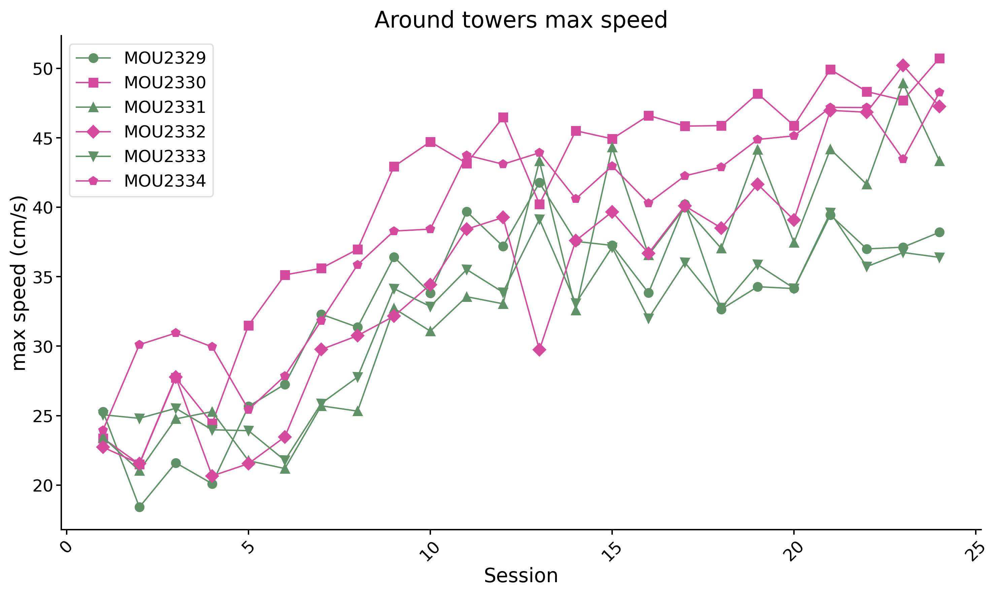

/tmp/ipykernel_119604/574286260.py:63: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


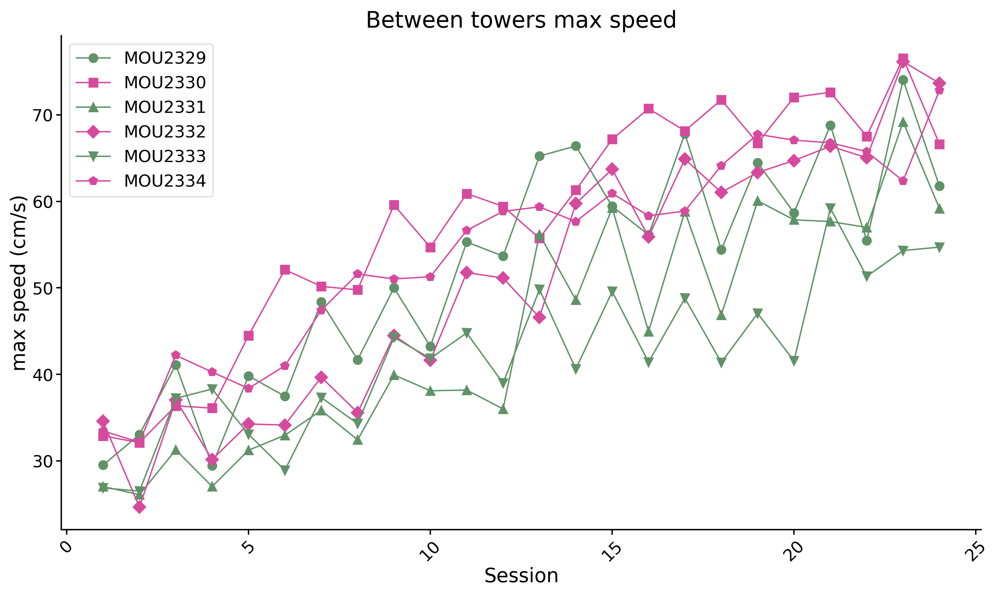

/tmp/ipykernel_119604/574286260.py:85: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


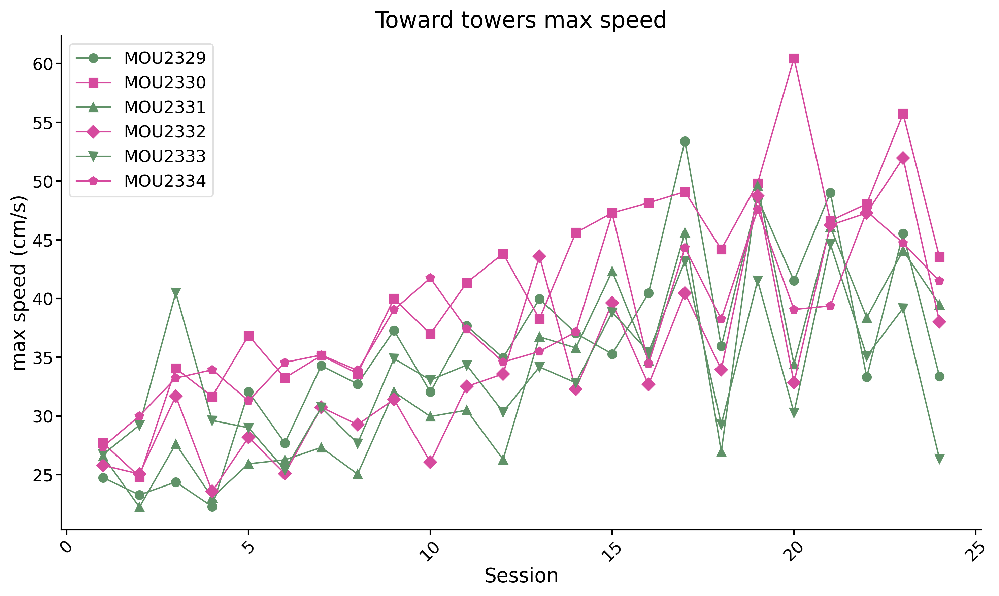

/tmp/ipykernel_119604/574286260.py:107: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


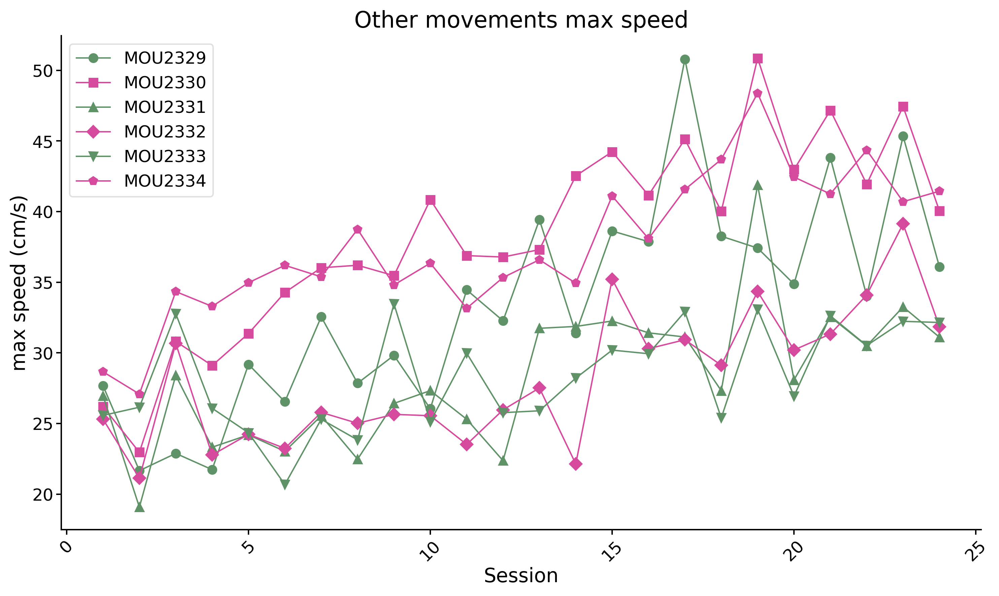

/tmp/ipykernel_119604/574286260.py:130: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


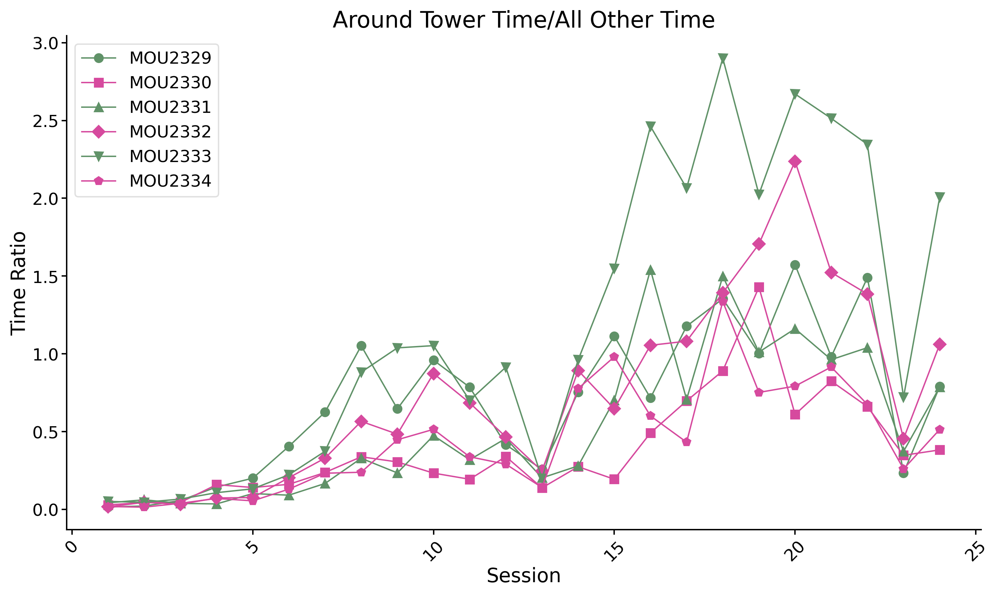

In [49]:
# this cell plots 5 behavioral features across animals and session. 
# If you want to plot something else fine but share it with others 



# Mapping odd and even mice names to colors
mice_colors = {}
for idx, mouse in enumerate(['MOU2329', 'MOU2330', 'MOU2331', 'MOU2332', 'MOU2333', 'MOU2334']):
    if idx % 2 == 0:
        mice_colors[mouse] = '#609268'
    else:
        mice_colors[mouse] = '#D64A9E'

# List of markers to use for different mice
markers = ['o', 's', '^', 'D', 'v', 'p']

# Mapping mice to markers
mice_markers = {}
for idx, mouse in enumerate(['MOU2329', 'MOU2330', 'MOU2331', 'MOU2332', 'MOU2333', 'MOU2334']):
    mice_markers[mouse] = markers[idx % len(markers)]

# Plotting the max speed around towers across sessions for each mouse
plt.figure(figsize=(10, 6))
for mouse, sessions_data in run_epochs_kinematics.items():
    maxspeed = []
    session_numbers = []

    # Enumerate through the sorted session keys
    for session_number, session in enumerate(sorted(sessions_data.keys()), start=1):
        
        maxspeed.append(np.median(sessions_data[session]['around_towers']['max_speed']))
        session_numbers.append(session_number)
    plt.plot(session_numbers, maxspeed, marker=mice_markers[mouse], linestyle='-', color=mice_colors[mouse], label=mouse)

plt.title('Around towers max speed', fontsize=16)
plt.xlabel('Session', fontsize=14)
plt.ylabel('max speed (cm/s)', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

# Plotting the max speed between towers across sessions for each mouse
plt.figure(figsize=(10, 6))
for mouse, sessions_data in run_epochs_kinematics.items():
    maxspeed = []
    session_numbers = []

    # Enumerate through the sorted session keys
    for session_number, session in enumerate(sorted(sessions_data.keys()), start=1):
        
        maxspeed.append(np.median(sessions_data[session]['between_towers']['max_speed']))
        session_numbers.append(session_number)
    plt.plot(session_numbers, maxspeed, marker=mice_markers[mouse], linestyle='-', color=mice_colors[mouse], label=mouse)

plt.title('Between towers max speed', fontsize=16)
plt.xlabel('Session', fontsize=14)
plt.ylabel('max speed (cm/s)', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

# Plotting the max speed around towers across sessions for each mouse
plt.figure(figsize=(10, 6))
for mouse, sessions_data in run_epochs_kinematics.items():
    maxspeed = []
    session_numbers = []

    # Enumerate through the sorted session keys
    for session_number, session in enumerate(sorted(sessions_data.keys()), start=1):
        
        maxspeed.append(np.median(sessions_data[session]['toward_towers']['max_speed']))
        session_numbers.append(session_number)
    plt.plot(session_numbers, maxspeed, marker=mice_markers[mouse], linestyle='-', color=mice_colors[mouse], label=mouse)

plt.title('Toward towers max speed', fontsize=16)
plt.xlabel('Session', fontsize=14)
plt.ylabel('max speed (cm/s)', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

# Plotting the max speed around towers across sessions for each mouse
plt.figure(figsize=(10, 6))
for mouse, sessions_data in run_epochs_kinematics.items():
    maxspeed = []
    session_numbers = []

    # Enumerate through the sorted session keys
    for session_number, session in enumerate(sorted(sessions_data.keys()), start=1):
        
        maxspeed.append(np.median(sessions_data[session]['other_runs']['max_speed']))
        session_numbers.append(session_number)
    plt.plot(session_numbers, maxspeed, marker=mice_markers[mouse], linestyle='-', color=mice_colors[mouse], label=mouse)

plt.title('Other movements max speed', fontsize=16)
plt.xlabel('Session', fontsize=14)
plt.ylabel('max speed (cm/s)', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


# Plotting the max speed around towers across sessions for each mouse
plt.figure(figsize=(10, 6))
for mouse, sessions_data in run_epochs_kinematics.items():
    ratio_around_outside_towers = []
    session_numbers = []

    # Enumerate through the sorted session keys
    for session_number, session in enumerate(sorted(sessions_data.keys()), start=1):
        
        ratio_around_outside_towers.append(sessions_data[session]['around_towers']['total_time'] / np.sum([sessions_data[session]['between_towers']['total_time'],sessions_data[session]['toward_towers']['total_time'],sessions_data[session]['other_runs']['total_time']]))
        session_numbers.append(session_number)
    plt.plot(session_numbers, ratio_around_outside_towers, marker=mice_markers[mouse], linestyle='-', color=mice_colors[mouse], label=mouse)

plt.title('Around Tower Time/All Other Time', fontsize=16)
plt.xlabel('Session', fontsize=14)
plt.ylabel('Time Ratio', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()





